In [2]:
import pandas as pd
import numpy as np

crime = pd.read_csv('crime.csv')
vacant_buildings = pd.read_csv('vacant_buildings.csv')

In [2]:
#crime.dtypes
crime.head()
#crime.shape

,CrimeDate,CrimeCode,Location,Description,Weapon,District,Neighborhood
0,10/14/2017,4A,2700 BEETHOVEN AVE,AGG. ASSAULT,FIREARM,NORTHWESTERN,NaN
1,10/14/2017,4E,4200 EDMONDSON AVE,COMMON ASSAULT,HANDS,SOUTHWESTERN,Rognel Heights
2,10/14/2017,4E,BALTIMORE ST & N HOWARD ST,COMMON ASSAULT,HANDS,CENTRAL,Downtown
3,10/14/2017,4E,BALTIMORE ST & N HOWARD ST,COMMON ASSAULT,HANDS,CENTRAL,Downtown
4,10/14/2017,4E,"400 WALTON AV, AAC",COMMON ASSAULT,HANDS,CENTRAL,Upton


In [5]:
vacant_buildings.dtypes
vacant_buildings.shape
vacant_buildings.head()

,ReferenceID,Block,Lot,BuildingAddress,NoticeDate,Neighborhood,PoliceDistrict,CouncilDistrict,Location
0,0002 019 031016,0002,019,1909 W NORTH AVE,03/10/2016,EASTERWOOD,WESTERN,7,"(39.30952601, -76.64848892)"
1,0007 057 031116,0007,057,1734 APPLETON ST,03/11/2016,EASTERWOOD,WESTERN,7,"(39.30856758, -76.64921157)"
2,0125 012 030816,0125,012,522 N CAREY ST,03/08/2016,HARLEM PARK,WESTERN,9,"(39.29482152, -76.63877572)"
3,0151 009 030716,0151,009,317 N GILMOR ST,03/07/2016,FRANKLIN SQUARE,WESTERN,9,"(39.29261888, -76.64231678)"
4,0232 032 031116,0232,032,1324 W LOMBARD ST,03/11/2016,UNION SQUARE,SOUTHERN,9,"(39.28680988, -76.63888529)"


In [4]:
import plotly.graph_objs as bp
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
#import plotly.offline as po
init_notebook_mode(connected=True)

date_of_crime = crime['CrimeDate'].tolist()
date_of_notice = vacant_buildings['NoticeDate'].tolist()

crime_date_box = bp.Box(x=date_of_crime)
notice_date_box = bp.Box(x=date_of_notice)
boxplot_data = [crime_date_box, notice_date_box]
iplot(boxplot_data)

In [5]:
Generate coords for crime locations (new column):

SyntaxError: invalid syntax (<ipython-input-5-a53a6eb1362b>, line 1)

In [5]:
from geopy.geocoders import Nominatim

get_coords = Nominatim()

crime_lat = []
crime_lon = []

crime_street_address = crime['Location'].tolist()
crime_street_address_clean = list(filter(None, crime_street_address))

#print(crime_street_address[2])

#for index in range(len(crime_street_address_clean)):
for index in range(10):
        #if any("&" in s for s in crime_street_address_clean):
        #print(crime_street_address_clean[index])
        crime_street_address_clean[index] = str(crime_street_address_clean[index]) + ' baltimore md'
        #print(crime_street_address_clean[index])
        #if any("," in s for s in crime_street_address_clean):
        #    crime_street_address_clean[index] = crime_street_address_clean[index].split(",")[0]
       # print(crime_street_address_clean[index])
       # print(crime_street_address_clean[index][:crime_street_address_clean[index].find('&')])
        #lat = get_coords.geocode(crime_street_address_clean[index].split("&")[0]).latitude
        #print(crime_street_address_clean[index].split("&")[0])
        #lat = get_coords.geocode(crime_street_address_clean[index].split(",")[0]).latitude
        #print("testing" + crime_street_address_clean[index].split(",")[0])
        try:
            crime_lat.append(get_coords.geocode(crime_street_address_clean[index]).latitude)
            crime_lon.append(get_coords.geocode(crime_street_address_clean[index]).longitude)
            
        except Exception:
            pass

In [6]:
geo_coords = vacant_buildings['Location'].tolist()

#print(len(geo_coords))
lat = []
lon = []

for index in range(len(geo_coords)):
     lat.append(float(geo_coords[index].split(",")[0][1:]))
     lon.append(float(geo_coords[index].split(",")[1][:-1]))
     
     
#print(lat)
#print(type(vacant_buildings['Location']))

#data = [ dict(
#        type = 'scattergeo',
#        locationmode = 'USA-states',
#        lon = lon,
#        lat = lat,
#        mode = 'markers',
#        marker = dict(
#            size = 8,
#            opacity = 0.8,
#            reversescale = True,
#            autocolorscale = False,
#            symbol = 'circle-open-dot',
#            line = dict(
#                width=1,
#                color='rgba(102, 102, 102)'
#            )
#        )),
data = bp.Data([
    bp.Scattermapbox(
        lat=lat,
        lon=lon,
        mode='markers',
        marker=bp.Marker(
            size=14
        ),
        text=['Montreal'],
    ),
    bp.Scattermapbox(
        lat=crime_lat,
        lon=crime_lon,
        mode='markers',
        marker=bp.Marker(
            size=14
        ),
        text=['Montreal'],
    )
])
#        dict(
#        type = 'scattergeo',
#        locationmode = 'USA-states',
#        lon = lon,
#        lat = lat,
#        mode = 'markers',
#        marker = dict(
#            size = 8,
#            opacity = 0.8,
#            reversescale = True,
#            autocolorscale = False,
#            symbol = 'circle-open-dot',
#            line = dict(
#                width=1,
#                color='rgba(102, 102, 102)'
#            )
#        ))
#    ]
layout = bp.Layout(
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken='pk.eyJ1IjoicHNpbmdocGF5YWwiLCJhIjoiY2o5MzhtamF5M3RhcTJ4bXJsdnA2Z3ZjbiJ9.lwJJeMpfCBEaxF-A7tRqBw',
        bearing=0,
        center=dict(
            lat=39.286138,
            lon=-76.603388
        ),
        pitch=0,
        zoom=5
    ),
)

#layout = dict(
#        title = 'vacancies in baltimore',
#        colorbar = True,
#        geo = dict(
#            scope='usa',
#            projection=dict( type='albers usa' ),
#            showland = True,
#            landcolor = "rgb(250, 250, 250)",
#            subunitcolor = "rgb(217, 217, 217)",
#            countrycolor = "rgb(217, 217, 217)",
#            countrywidth = 0.5,
#            subunitwidth = 0.5
#        ),
#    )

fig = dict( data=data, layout=layout )
iplot( fig, validate=False, filename='vacancies' )

In [ ]:
group by year for crime date and notice date?
crimeDate vs NoticeDate Scatterplot

In [10]:
crime_date = crime['CrimeDate']
notice_date = vacant_buildings['NoticeDate']

fig = {
    'data': [
            'x': crime_date.gdpPercap, 
            'y': crime_date.lifeExp, 
            'text': df2007.country, 
            'mode': 'markers', 
            'name': '2007'},
        {
            'x': df1952.gdpPercap, 
            'y': df1952.lifeExp, 
            'text': df1952.country, 
            'mode': 'markers', 
            'name': '1952'}
    ],
    'layout': {
        'xaxis': {'title': 'GDP per Capita', 'type': 'log'},
        'yaxis': {'title': "Life Expectancy"}
    }
}

# IPython notebook
# py.iplot(fig, filename='pandas/multiple-scatter')

url = py.plot(fig, filename='pandas/multiple-scatter')

SyntaxError: invalid syntax (<ipython-input-10-275d6825970e>, line 6)

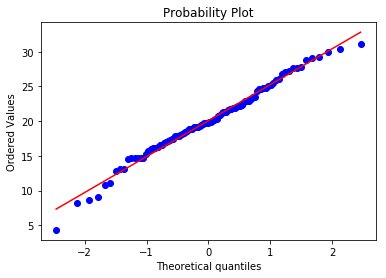

In [70]:
import pylab 
import scipy.stats as stats

measurements = np.random.normal(loc = 20, scale = 5, size=100)   
stats.probplot(measurements, dist="norm", plot=pylab)
pylab.show()

In [ ]:
One Hot Encoding:

In [11]:
from sklearn import preprocessing

weapon_used = crime[['CrimeCode']]

le = preprocessing.LabelEncoder()

encoded_weapon_used = weapon_used.apply(le.fit_transform)
encoded_weapon_used.head()

,CrimeCode
0,38
1,42
2,42
3,42
4,42


In [ ]:
ordinal:

In [12]:
# create a sample of OPs unique values
weapon = pd.Series(crime['Weapon'])
mapper = {1: 'OTHER', 2: 'HANDS', 3: 'KNIFE', 4:'FIREARM'}
nomvar = weapon.replace(mapper)

# now let's use pandas.get_dummies
print(pd.factorize(nomvar))

(array([ 0,  1,  1, ..., -1, -1, -1]), Index(['FIREARM', 'HANDS', 'KNIFE', 'OTHER'], dtype='object'))


In [ ]:
Potential Outliers:
    Total Crimes grouped by description

In [22]:
crime.Description.unique()
crime.groupby('Description').CrimeDate.nunique()

Description
AGG. ASSAULT            2114
ARSON                   1004
ASSAULT BY THREAT       1628
AUTO THEFT              2114
BURGLARY                2114
COMMON ASSAULT          2114
HOMICIDE                1080
LARCENY                 2114
LARCENY FROM AUTO       2113
RAPE                    1116
ROBBERY - CARJACKING     987
ROBBERY - COMMERCIAL    1725
ROBBERY - RESIDENCE     1453
ROBBERY - STREET        2110
SHOOTING                1428
Name: CrimeDate, dtype: int64

In [ ]:
Handling Missing Data:
    
    use CrimeCode to fill Weapon

In [35]:
crime_code = crime['CrimeCode'] 
code_weapon = crime[['CrimeCode', 'Description', 'Weapon']]

#code_weapon.head()
#crime.Weapon.unique()
#crime.CrimeCode.unique()
#crime.groupby('CrimeCode')
#code_weapon.head(100)
#code_weapon.loc[(code_weapon['Weapon'] is None)] 
#code_weapon.groupby(['CrimeCode', 'Description', 'Weapon']).Weapon.count() 
#code_weapon.groupby(['CrimeCode']).CrimeCode.count() 
code_weapon.loc[code_weapon['CrimeCode'] == '6K']


,CrimeCode,Description,Weapon
117344,6K,LARCENY,NaN
